In [2]:
cd /orange/adamginsburg/w51/gtc/GTC2-20AFLO/OB0001/object

/orange/adamginsburg/w51/gtc/GTC2-20AFLO/OB0001/object


In [3]:
files = !ls *fits

In [4]:
len(files)

234

In [5]:
files[1]

'0002613547-20200712-EMIR-STARE_IMAGE.fits'

In [6]:
from astropy.io import fits

In [7]:
filehandle = fits.open(files[1])

In [8]:
filehandle

In [9]:
from astropy.wcs import WCS

In [10]:
filehandle[0].header

SIMPLE  =                    T / file does conform to FITS standard             
BITPIX  =                   16 / number of bits per data pixel                  
NAXIS   =                    2 / number of data axes                            
NAXIS1  =                 2048 / length of data axis 1                          
NAXIS2  =                 2048 / length of data axis 2                          
EXTEND  =                    T / FITS dataset may contain extensions            
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H 
BZERO   =                32768 / offset data range to that of unsigned short    
BSCALE  =                    1 / default scaling factor                         
DETVER  = 'SCI     '           / 401 Detector used: science or engineering      
NSEC    =                    1 / 402 Number of sequences executed at detector   
NRST    =                   

In [11]:
filehandle[0].header['FILTER']

'J'

In [12]:
ww = WCS(filehandle[0].header)

In [13]:
%matplotlib inline
import pylab as pl
from astropy import visualization
pl.style.use('dark_background')

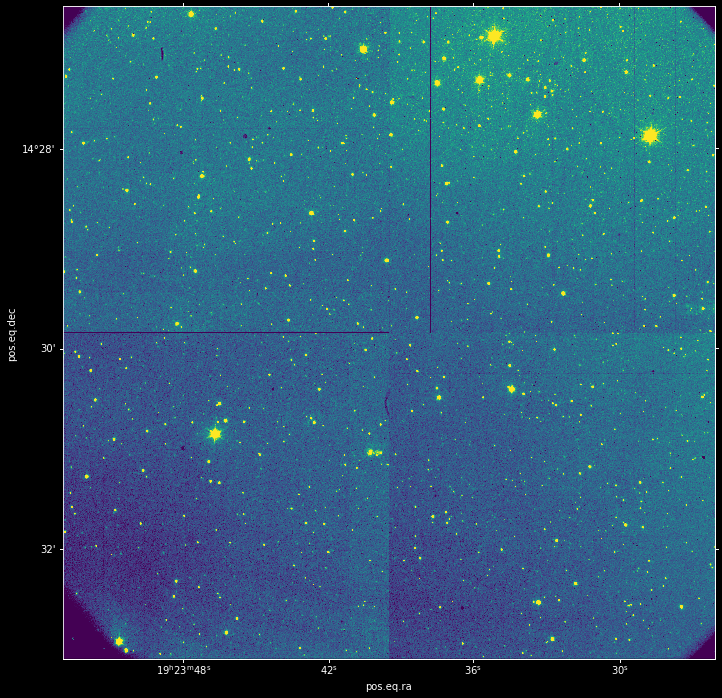

In [14]:
# https://docs.astropy.org/en/stable/visualization/wcsaxes/
pl.figure(figsize=(12,12))
pl.subplot(projection=ww) # this line makes the image show up with RA/Dec coordinates
pl.imshow(filehandle[0].data,
          norm=visualization.simple_norm(filehandle[0].data, min_percent=1, max_percent=99.5))

In [15]:
from astroquery.vizier import Vizier
from astropy import coordinates, units as u

In [16]:
# cx, cy are 1024
cy, cx = (x/2 for x in filehandle[0].data.shape)
cx, cy

(1024.0, 1024.0)

In [17]:
ra, dec = ww.wcs_pix2world(cx, cy, 0)*u.deg
ra, dec

(<Quantity 290.91455542 deg>, <Quantity 14.49731875 deg>)

In [18]:
center = coordinates.SkyCoord(ra, dec, frame='fk5')
center

<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (290.91455542, 14.49731875)>

In [19]:
tables = Vizier(row_limit=10000).query_region(center, radius=5*u.arcmin, catalog='2MASS')
tables

TableList with 2 tables:
	'0:II/246/out' with 15 column(s) and 1694 row(s) 
	'1:VII/233/xsc' with 13 column(s) and 13 row(s) 

In [20]:
table = tables[0]

In [21]:
table.meta

{'ID': 'II_246_out',
 'name': 'II/246/out',
 'description': '2MASS Point Source Catalogue, output (on a total of 470,992,970 sources)'}

In [22]:
table

RAJ2000,DEJ2000,_2MASS,Jmag,e_Jmag,Hmag,e_Hmag,Kmag,e_Kmag,Qflg,Rflg,Bflg,Cflg,Xflg,Aflg
deg,deg,,mag,mag,mag,mag,mag,mag,,,,,,
float64,float64,bytes17,float32,float32,float32,float32,float32,float32,bytes3,bytes3,bytes3,bytes3,uint8,uint8
290.861815,14.434303,19232683+1426034,15.676,0.076,14.912,0.080,14.508,0.105,AAA,222,111,000,0,0
290.862897,14.431400,19232709+1425530,15.336,0.056,14.426,0.063,14.175,0.076,AAA,222,111,000,0,0
290.865386,14.437401,19232769+1426146,14.864,0.050,14.083,0.066,13.798,0.063,AAA,222,111,000,0,0
290.866367,14.432429,19232792+1425567,15.770,--,15.401,0.151,14.370,--,UBU,020,010,000,0,0
290.872864,14.436471,19232948+1426112,17.823,--,14.175,0.055,10.756,0.022,UAA,022,011,000,0,0
290.873401,14.431552,19232961+1425535,16.439,--,15.643,--,14.172,0.085,UUA,002,001,000,0,0
290.874130,14.425013,19232979+1425300,16.363,0.121,15.454,0.128,14.910,--,BBU,220,110,0c0,0,0
290.874302,14.426958,19232983+1425370,17.531,--,15.246,--,14.683,0.110,UUB,002,001,00c,0,0


In [23]:
table_coordinates = coordinates.SkyCoord(table['RAJ2000'], table['DEJ2000'], frame='fk5')

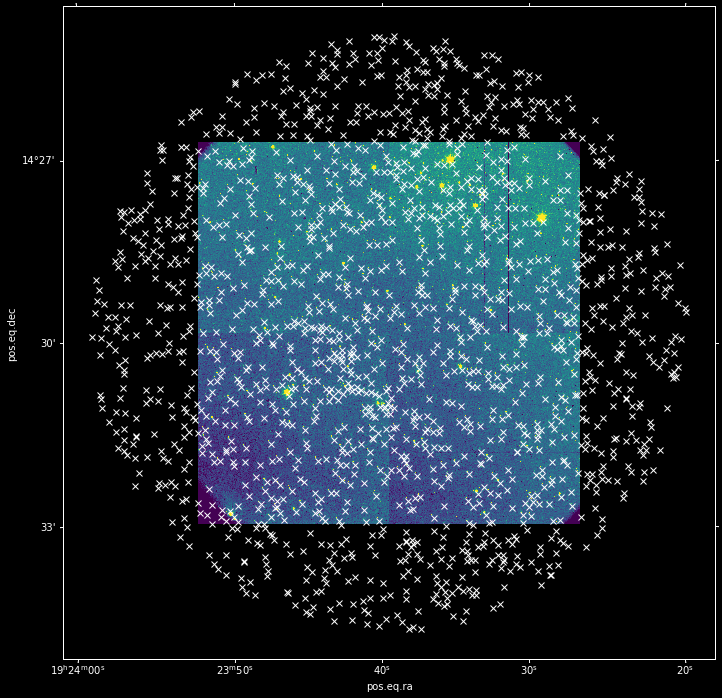

In [24]:
pl.figure(figsize=(12,12))
ax = pl.subplot(projection=ww)
pl.imshow(filehandle[0].data, norm=visualization.simple_norm(filehandle[0].data, min_percent=1, max_percent=99.5))
pl.plot(table_coordinates.ra, table_coordinates.dec, transform=ax.get_transform('world'), marker='x', color='w', linestyle='none')

(-0.5, 2047.5, -0.5, 2047.5)

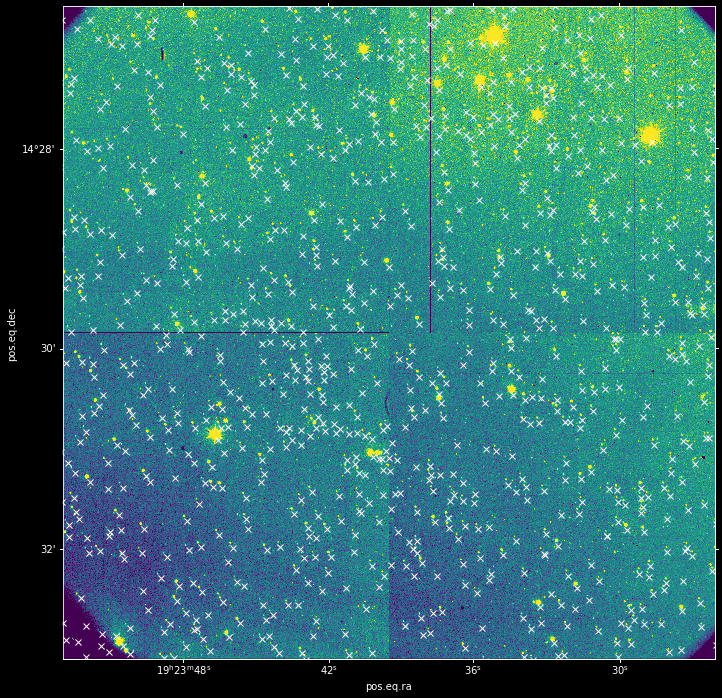

In [25]:
pl.figure(figsize=(12,12))
ax = pl.subplot(projection=ww)
pl.imshow(filehandle[0].data, norm=visualization.simple_norm(filehandle[0].data, min_percent=1, max_percent=99))
axlims = ax.axis()
pl.plot(table_coordinates.ra, table_coordinates.dec, transform=ax.get_transform('world'), marker='x', color='w', linestyle='none')
ax.axis(axlims)

In [26]:
brightstars = table['Jmag'] < 12
brightstars.sum()

38

(-0.5, 2047.5, -0.5, 2047.5)

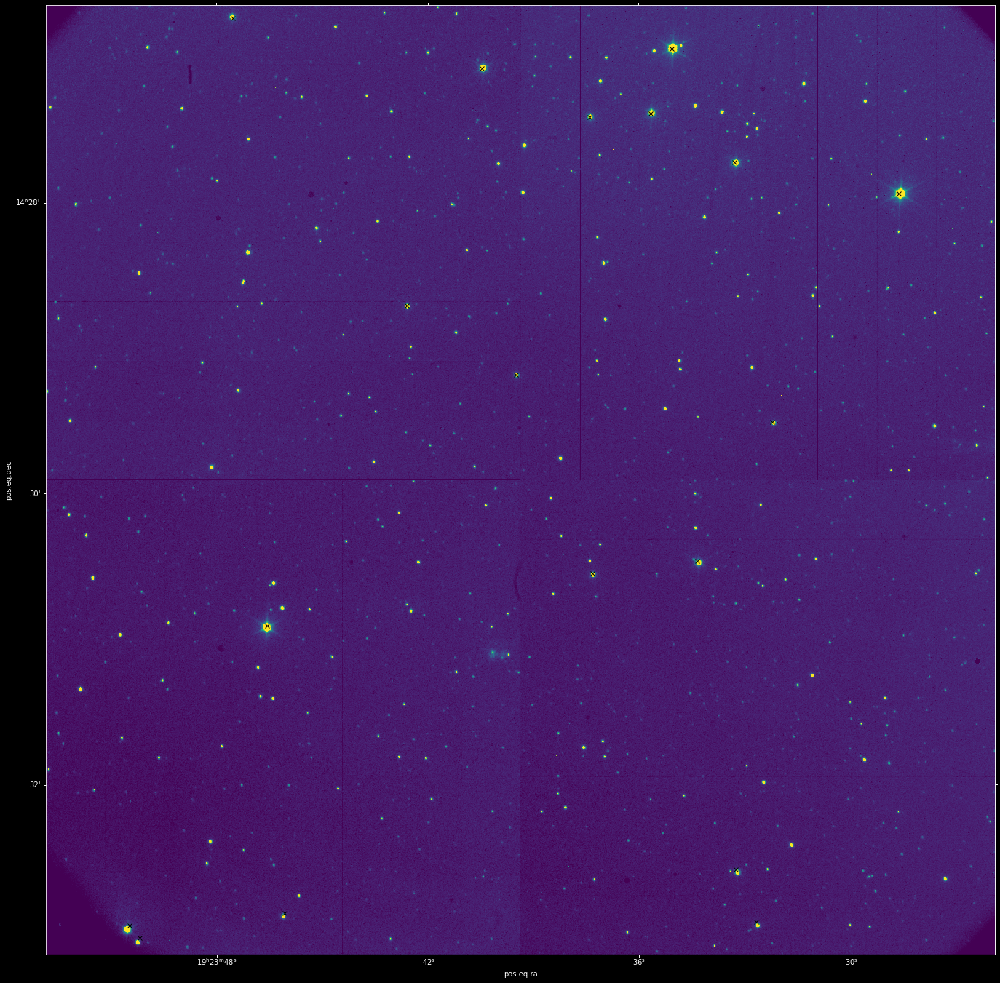

In [27]:
# because the offset was so bad, I decided to try to fix the WCS a little before doing cross-matching
# the code below re-loads the WCS, then shifts it up by 4" and left by 1.8"
ww = WCS(filehandle[0].header)
ww.wcs.crval[1] += 4/3600
ww.wcs.crval[0] -= 1.8/3600


pl.figure(figsize=(24,24))
ax = pl.subplot(projection=ww)
pl.imshow(filehandle[0].data, norm=visualization.simple_norm(filehandle[0].data, min_percent=1, max_percent=99.9))
axlims = ax.axis()
pl.plot(table_coordinates.ra[brightstars],
        table_coordinates.dec[brightstars],
        transform=ax.get_transform('world'), marker='x', color='k', linestyle='none')
ax.axis(axlims)

In [28]:
from photutils import DAOStarFinder
std = filehandle[0].data.std() # crummy guess!!
daofind = DAOStarFinder(fwhm=3.0, threshold=4.*std)

In [29]:
import numpy as np
starcat = daofind(filehandle[0].data - np.median(filehandle[0].data)) 

In [30]:
starcat

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64
1,1441.0645427480445,19.192388565805146,0.5217523093564176,0.030781115698468735,0.3481429607860973,25,0.0,9257.0,1.8803717801253184,-0.6856093121140079
2,197.92062130418935,25.992162135947158,0.26883671468820786,-0.453509704667025,0.12428916287707914,25,0.0,41183.0,4.825575971486801,-1.7088728933237087
3,197.5533041611249,26.7214090014714,0.4205658034137177,0.3361722002528399,0.36887255703105065,25,0.0,41491.0,6.123524775858303,-1.9675036983580658
4,742.7637736618561,33.662157369602006,0.4194739905746352,0.1377574377105884,0.37523154780705326,25,0.0,8183.0,1.7415008248470902,-0.6023092112355011
5,1253.3791322305376,48.265865630918825,0.3848177110237233,0.09988282893171607,0.352034642080393,25,0.0,11927.0,2.5172793821052784,-1.0023285467902932
6,175.62327614569455,49.48834309616999,0.5745841776254008,-0.04280030208916451,0.00980386660785909,25,0.0,41295.0,5.415484828215753,-1.834093358679084
7,176.31479245408897,55.84101323858914,0.5200190822011149,-0.7960564183277112,-0.08195303749450307,25,0.0,41926.0,4.590048879178022,-1.6545432758498344
8,1775.9142580860191,59.6592211969767,0.48924950598029165,0.23278866704017684,0.3654860966207798,25,0.0,7558.0,1.5085014389526261,-0.4463643219568141
9,1534.759065973135,62.06369156809611,0.3004149504642,-0.11207005191720815,-0.04291570624659074,25,0.0,39873.0,5.8864010976856385,-1.9246246286838105


(-0.5, 2047.5, -0.5, 2047.5)

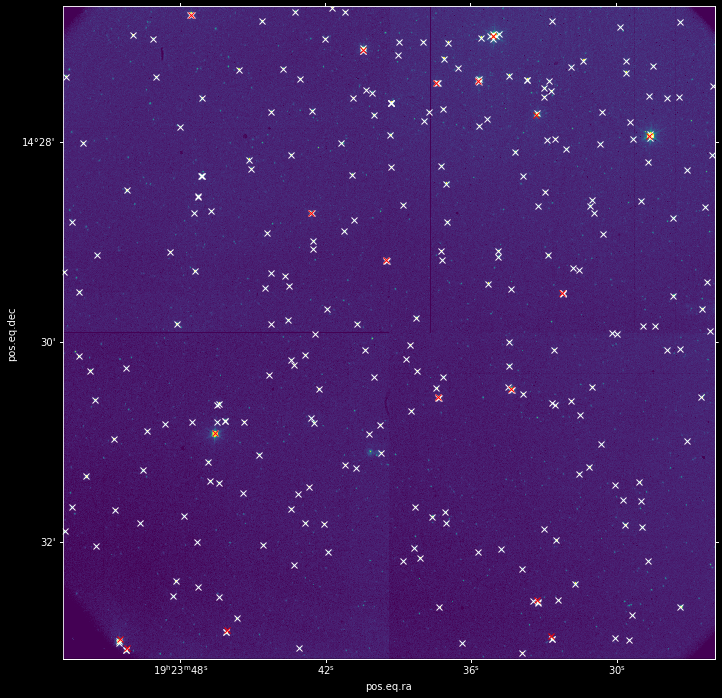

In [31]:
pl.figure(figsize=(12,12))
ax = pl.subplot(projection=ww)
pl.imshow(filehandle[0].data, norm=visualization.simple_norm(filehandle[0].data, min_percent=1, max_percent=99.9))
pl.plot(starcat['xcentroid'], starcat['ycentroid'], 'wx')
pl.plot(table_coordinates.ra[brightstars],
        table_coordinates.dec[brightstars],
        transform=ax.get_transform('world'), marker='x', color='r', linestyle='none')
ax.axis(axlims)

In [32]:
xc, yc = ww.all_world2pix(table_coordinates.ra, table_coordinates.dec, 0)

In [33]:
ra, dec = ww.all_pix2world(starcat['xcentroid'], starcat['ycentroid'], 0)*u.deg

In [34]:
starfind_coords = coordinates.SkyCoord(ra, dec, frame='fk5')

In [35]:
starfind_coords.shape, table_coordinates.shape

((289,), (1694,))

In [36]:
match_index, match_distance, _ = coordinates.match_coordinates_sky(starfind_coords, table_coordinates)

(array([234.,  45.,   5.,   1.,   0.,   0.,   1.,   1.,   0.,   2.]),
 array([2.11742612e-03, 1.01920983e+00, 2.03630223e+00, 3.05339464e+00,
        4.07048704e+00, 5.08757945e+00, 6.10467185e+00, 7.12176425e+00,
        8.13885666e+00, 9.15594906e+00, 1.01730415e+01]),
 <a list of 10 Patch objects>)

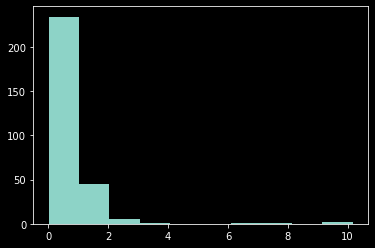

In [37]:
pl.hist(match_distance.to(u.arcsec).value)

In [38]:
new_sky_coordinates = table_coordinates[match_index]
new_sky_coordinates_xy = ww.all_world2pix(new_sky_coordinates.ra, new_sky_coordinates.dec, 0)

(-0.5, 2047.5, -0.5, 2047.5)

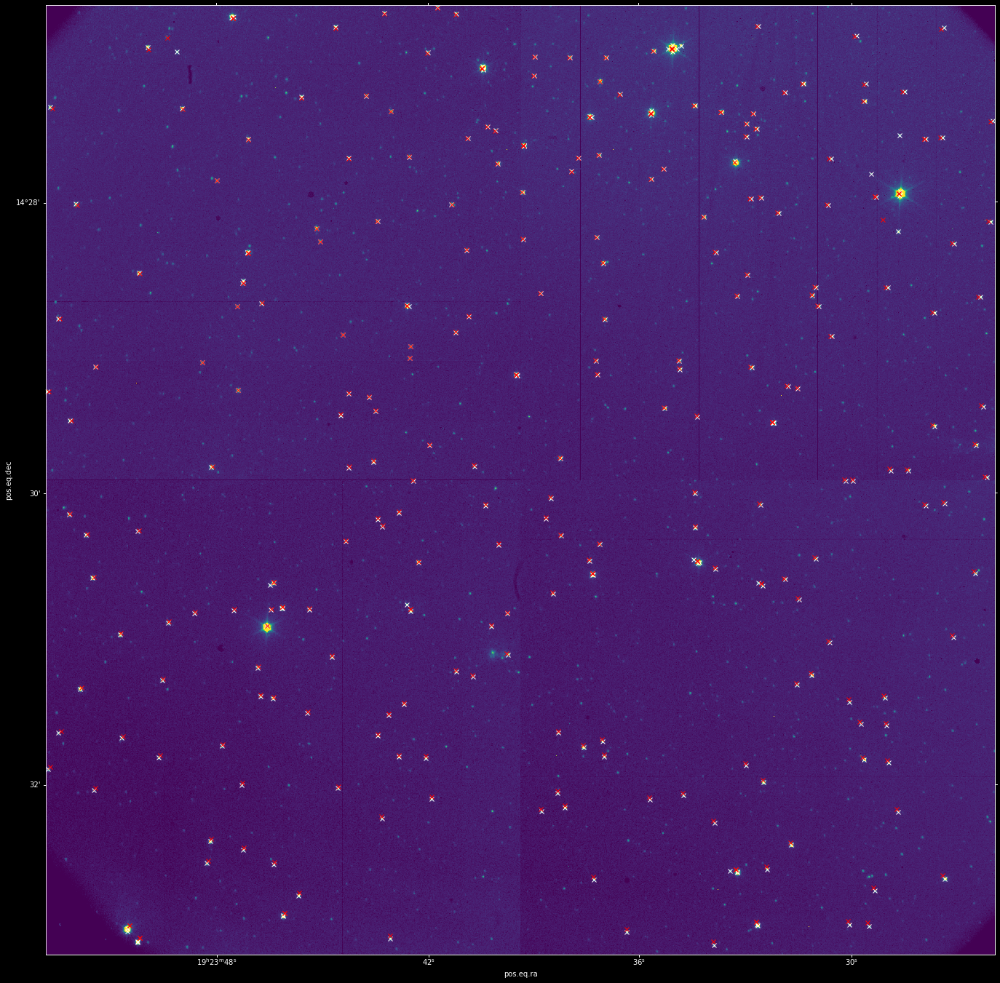

In [39]:
pl.figure(figsize=(24,24))
ax = pl.subplot(projection=ww)
pl.imshow(filehandle[0].data, norm=visualization.simple_norm(filehandle[0].data, min_percent=1, max_percent=99.9))
pl.plot(starcat['xcentroid'], starcat['ycentroid'], 'wx')
pl.plot(new_sky_coordinates_xy[0], new_sky_coordinates_xy[1], 'rx')
ax.axis(axlims)

In [40]:
from astropy.wcs.utils import fit_wcs_from_points

In [41]:
xy_starfind = np.array([starcat['xcentroid'], starcat['ycentroid']])

In [42]:
new_wcs = fit_wcs_from_points(xy_starfind, new_sky_coordinates, sip_degree=2)

In [43]:
new_wcs

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN-SIP'  'DEC--TAN-SIP'  
CRVAL : 290.9144220200281  14.497874075152673  
CRPIX : 1019.2507080231504  1033.3686064111682  
CD1_1 CD1_2  : -5.332166057707897e-05  1.841685377513357e-08  
CD2_1 CD2_2  : 4.5276773039070407e-08  -5.3269618592548036e-05  
NAXIS : 2039.9011626369606  2023.7232253964492

In [44]:
new_ra, new_dec = new_wcs.wcs_pix2world(starcat['xcentroid'], starcat['ycentroid'], 0)*u.deg

In [45]:
visualization.quantity_support()

<astropy.visualization.units.quantity_support.<locals>.MplQuantityConverter at 0x2ad9d0e06278>

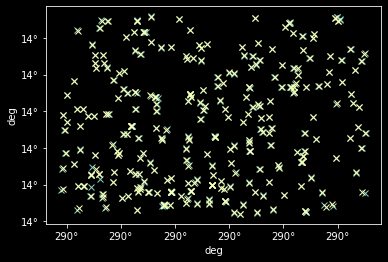

In [46]:
pl.plot(new_ra, new_dec, 'x')
pl.plot(new_sky_coordinates.ra, new_sky_coordinates.dec, 'x')

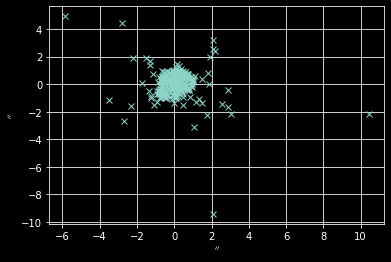

In [47]:
ra_residual = (new_ra-new_sky_coordinates.ra).to(u.arcsec)
dec_residual = (new_dec-new_sky_coordinates.dec).to(u.arcsec)
pl.plot(ra_residual, dec_residual, 'x')
pl.grid()

In [48]:
bad_matches = (ra_residual < -2*u.arcsec) | (ra_residual > 2*u.arcsec) | (dec_residual > 2*u.arcsec) | (dec_residual < -2*u.arcsec)
bad_matches.sum(), len(bad_matches)

(17, 289)

In [49]:
xy_starfind2 = xy_starfind.T[~bad_matches].T
new_sky_coordinates2 = new_sky_coordinates.T[~bad_matches].T
new_wcs2 = fit_wcs_from_points(xy_starfind2, new_sky_coordinates2, sip_degree=3)

In [50]:
new_ra2, new_dec2 = new_wcs2.wcs_pix2world(starcat['xcentroid'], starcat['ycentroid'], 0)*u.deg

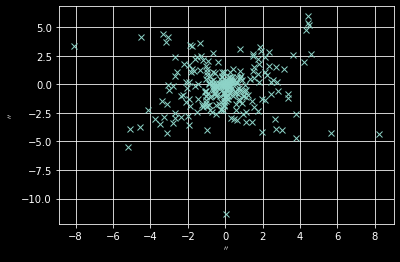

In [51]:
ra_residual2 = (new_ra2-new_sky_coordinates.ra).to(u.arcsec)
dec_residual2 = (new_dec2-new_sky_coordinates.dec).to(u.arcsec)
pl.plot(ra_residual2, dec_residual2, 'x')
pl.grid()

In [52]:
new_wcs2

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN-SIP'  'DEC--TAN-SIP'  
CRVAL : 290.9144220200281  14.497874075152673  
CRPIX : 1019.4225404467301  1033.137942573949  
CD1_1 CD1_2  : -5.403240070742326e-05  -1.528448316362426e-08  
CD2_1 CD2_2  : 6.677509691311685e-09  -5.402708082262943e-05  
NAXIS : 2035.3374892238605  2023.7232253964492

(-0.5, 2047.5, -0.5, 2047.5)

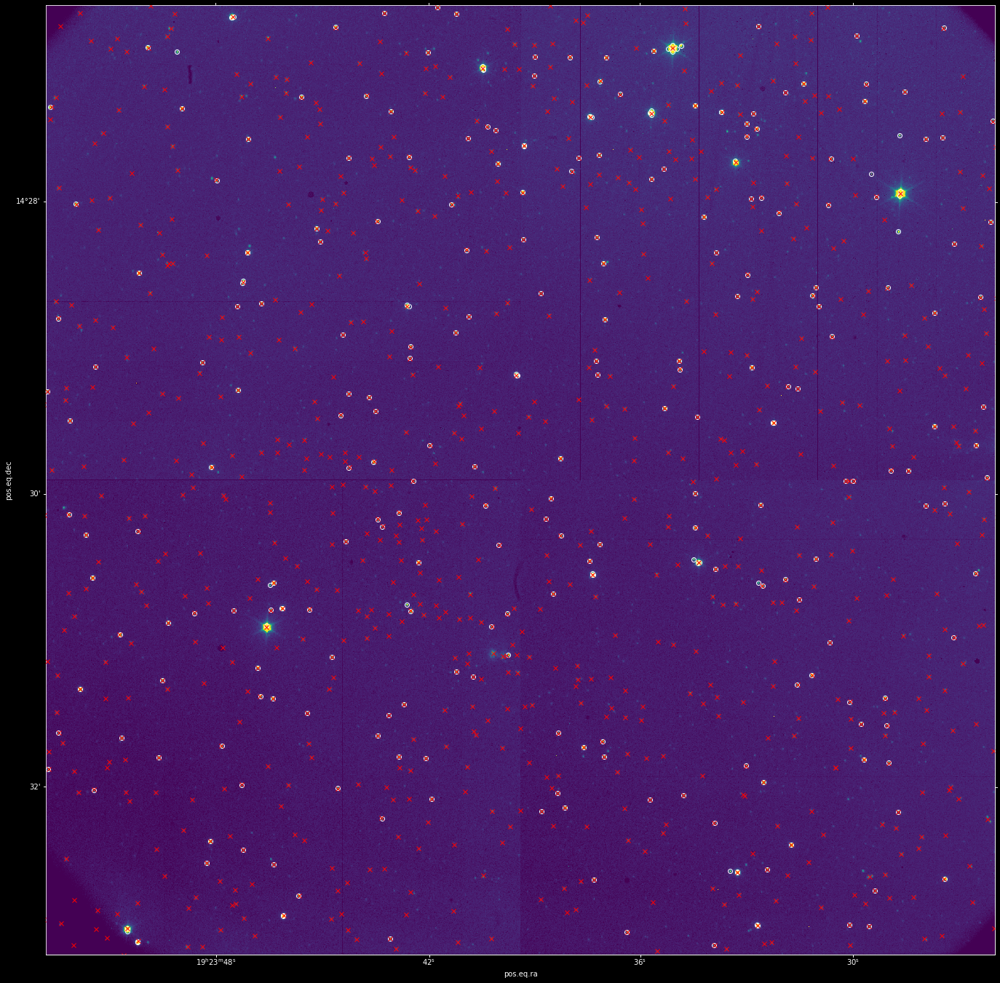

In [58]:
pl.figure(figsize=(24,24))
ax = pl.subplot(projection=new_wcs2)
pl.imshow(filehandle[0].data, norm=visualization.simple_norm(filehandle[0].data, min_percent=1, max_percent=99.9))
pl.plot(starcat['xcentroid'], starcat['ycentroid'], 'wo', markeredgecolor='w', markerfacecolor='none')
pl.plot(table_coordinates.ra,
        table_coordinates.dec,
        transform=ax.get_transform('world'), marker='x', color='r', linestyle='none')
ax.axis(axlims)

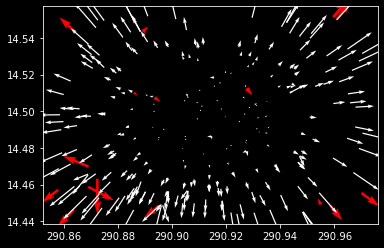

In [54]:
#per star shifts
#pl.quiver(new_ra.value, new_dec.value, ra_residual2.value, dec_residual2.value, color='w')
pl.quiver(new_ra.value[bad_matches], new_dec.value[bad_matches], ra_residual2.value[bad_matches], dec_residual2.value[bad_matches], color='r')
pl.quiver(new_ra.value[~bad_matches], new_dec.value[~bad_matches], ra_residual2.value[~bad_matches], dec_residual2.value[~bad_matches], color='w')

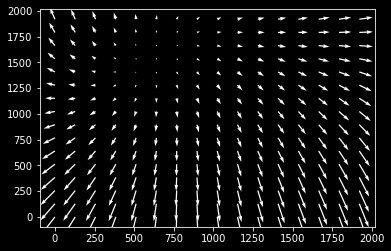

In [55]:
#distortion model in pixel coords
ygrid, xgrid = np.mgrid[0:2048:128, 0:2048:128]
r1,d1 = ww.all_pix2world(xgrid, ygrid, 0)
r2,d2 = new_wcs2.all_pix2world(xgrid, ygrid, 0)
pl.quiver(xgrid, ygrid, r2-r1, d2-d1, color='w')

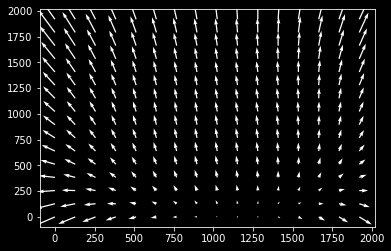

In [56]:
ygrid, xgrid = np.mgrid[0:2048:128, 0:2048:128]
# this doesn't do anything because the original "ww" didn't have SIP coefficients (x1 == xgrid exactly)
x1,y1 = ww.sip_pix2foc(xgrid, ygrid, 0)
# `sip_pix2foc` returns locations relative to crpix, so we redefine x1,x2 to be relative to crpix
x1,y1 = xgrid - ww.wcs.crpix[0], ygrid - ww.wcs.crpix[1]
x2,y2 = new_wcs2.sip_pix2foc(xgrid, ygrid, 0)
pl.quiver(xgrid, ygrid, x1-x2, y1-y2, color='w')